<a href="https://colab.research.google.com/github/marcekovam/data_science_practicum/blob/main/HW_LogReg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

We will be analysing the 'Default of credit card clients' dataset. Code and data itself can be found [here](https://www.kaggle.com/code/mariosfish/default-of-credit-card-clients-lr-dt-nn).

Below there are the description of the attributes that will be used in our model:

- `LIMIT_BAL`: Amount of the given credit (NT dollar). It includes both the individual consumer credit and his/her family (supplementary) credit.
- `SEX`: Gender (1 = male; 2 = female).
- `EDUCATION`: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).
- `MARRIAGE`: Marital status (1 = married; 2 = single; 3 = others).
- `AGE`: Age (year).
- `PAY_1`: the repayment status in September, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `PAY_2`: the repayment status in August, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `PAY_3`: the repayment status in July, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `PAY_4`: the repayment status in June, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `PAY_5`: the repayment status in May, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `PAY_6`: the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.
- `BILL_AMT1`: Amount of bill statement (NT dollar). Amount of bill statement in September, 2005.
- `BILL_AMT2`: Amount of bill statement (NT dollar). Amount of bill statement in August, 2005.
- `BILL_AMT3`: Amount of bill statement (NT dollar). Amount of bill statement in July, 2005.
- `BILL_AMT4`: Amount of bill statement (NT dollar). Amount of bill statement in June, 2005.
- `BILL_AMT5`: Amount of bill statement (NT dollar). Amount of bill statement in May, 2005.
- `BILL_AMT6`: Amount of bill statement (NT dollar). Amount of bill statement in April, 2005.
- `PAY_AMT1`: Amount of previous payment (NT dollar). Amount paid in September, 2005.
- `PAY_AMT2`: Amount of previous payment (NT dollar). Amount paid in August, 2005.
- `PAY_AMT3`: Amount of previous payment (NT dollar). Amount paid in July, 2005.
- `PAY_AMT4`: Amount of previous payment (NT dollar). Amount paid in June, 2005.
- `PAY_AMT5`: Amount of previous payment (NT dollar). Amount paid in May, 2005.
- `PAY_AMT6`: Amount of previous payment (NT dollar). Amount paid in June, 2005.
- `dpnm`: Default payment next month.(Yes = 1, No = 0)

Our goal is to predict the class value of `dpnm` column.

In [ ]:
!pip install -qq shap

# Load and clean the data

Import libraries/packages

In [ ]:
### General libraries ###
import pandas as pd
from pandas.api.types import CategoricalDtype
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import graphviz
from graphviz import Source
from IPython.display import SVG

##################################

### ML Models ###
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler

##################################

### Metrics ###
from sklearn import metrics
from sklearn.metrics import f1_score,confusion_matrix, mean_squared_error, mean_absolute_error, classification_report, roc_auc_score, roc_curve, precision_score, recall_score

Download and load the data

In [ ]:
import os

os.environ['KAGGLE_USERNAME'] = 'amllogin'
os.environ['KAGGLE_KEY'] = '35eca611ac64064016cba986e2161cdd'

!kaggle datasets download -d mariosfish/default-of-credit-card-clients -p /content/dataset

default-of-credit-card-clients.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile

with zipfile.ZipFile('/content/dataset/default-of-credit-card-clients.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dataset/')

import pandas as pd

# Load the data.
data = pd.read_csv('/content/dataset/default of credit card clients.csv')

# Information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ID         30000 non-null  int64
 1   LIMIT_BAL  30000 non-null  int64
 2   SEX        30000 non-null  int64
 3   EDUCATION  30000 non-null  int64
 4   MARRIAGE   30000 non-null  int64
 5   AGE        30000 non-null  int64
 6   PAY_1      30000 non-null  int64
 7   PAY_2      30000 non-null  int64
 8   PAY_3      30000 non-null  int64
 9   PAY_4      30000 non-null  int64
 10  PAY_5      30000 non-null  int64
 11  PAY_6      30000 non-null  int64
 12  BILL_AMT1  30000 non-null  int64
 13  BILL_AMT2  30000 non-null  int64
 14  BILL_AMT3  30000 non-null  int64
 15  BILL_AMT4  30000 non-null  int64
 16  BILL_AMT5  30000 non-null  int64
 17  BILL_AMT6  30000 non-null  int64
 18  PAY_AMT1   30000 non-null  int64
 19  PAY_AMT2   30000 non-null  int64
 20  PAY_AMT3   30000 non-null  int64
 21  PAY_AMT4   3

Since the `ID` column is for indexing purposes only, we remove it from the dataset.

In [ ]:
data=data.drop(['ID'], axis=1)

We check for duplicate rows and we remove them.

In [ ]:
# Check for duplicate rows.
print(f"There are {data.duplicated().sum()} duplicate rows in the data set.")

# Remove duplicate rows.
data=data.drop_duplicates()
print("The duplicate rows were removed.")

There are 35 duplicate rows in the data set.
The duplicate rows were removed.


Next we also check for null values.

In [ ]:
# Check for null values.
print(f"There are {data.isna().any().sum()} cells with null values in the data set.")

There are 0 cells with null values in the data set.


Plot of the correlation matrix

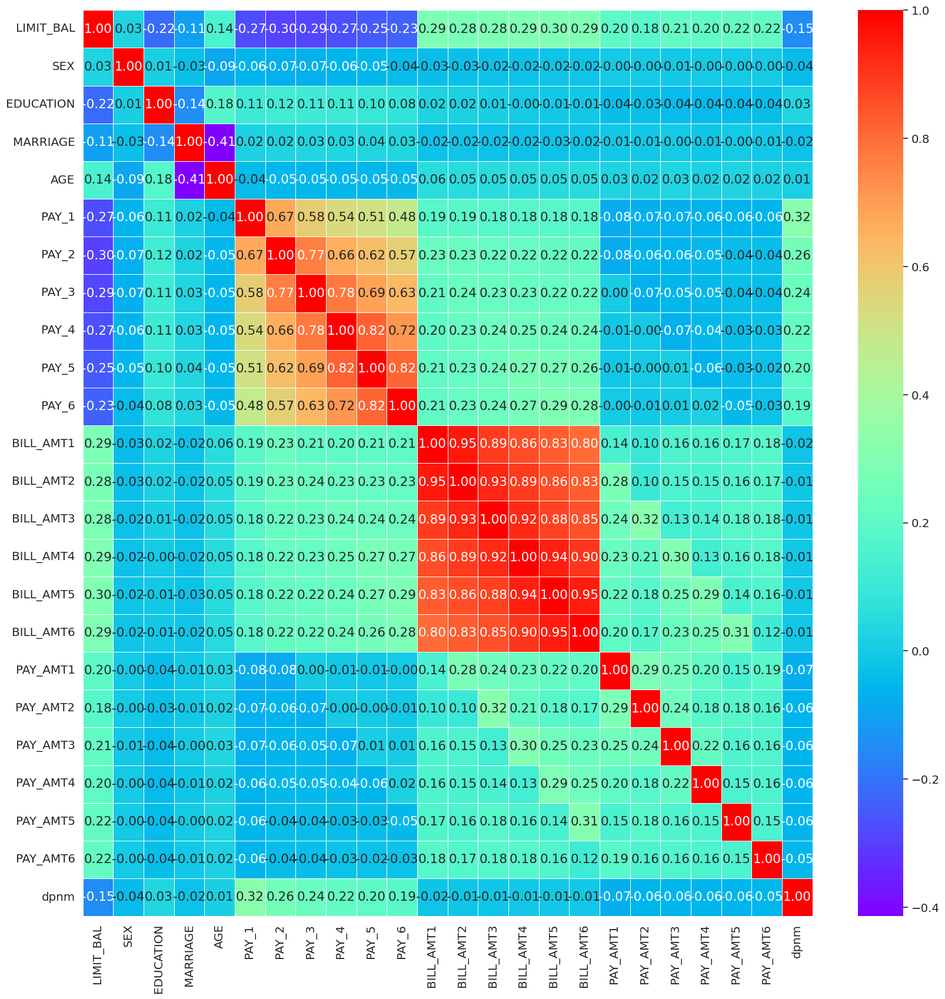

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True, cmap='rainbow',linewidth=0.5, fmt='.2f');

# Pre-processing

We prepare data for our model. We choose the columns that will be our independed variables and which column the class that we want to predict. Then we split our data into train and test sets and perfom a standardization upon them.

In [ ]:
# Distinguish attribute columns and class column.
X=data[data.columns[:-1]]
y=data['dpnm']

In [ ]:
# Split to train and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=25)

In [ ]:
# Standardization
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Modeling

We will build logistic regression model. Accuracy, f1 score, confusion matrix and ROC will be calculated. Then we will use the `GridSearchCV` module to tune our model and search for the best hyperparameters in order to increase the accuracy of the model.


In [ ]:
# Initialize a Logistic Regression estimator.
logreg=LogisticRegression(multi_class='auto', random_state=25, n_jobs=-1)

# Train the estimator.
logreg.fit(X_train,y_train)

LogisticRegression(n_jobs=-1, random_state=25)

In [ ]:
# Make predictions.
log_pred=logreg.predict(X_test)

#CV score
logreg_cv=cross_val_score(logreg, X_train, y_train, cv=10).mean()

Metrics for Logistic Regression

In [ ]:
# Accuracy: 1 is perfect prediction.
print('Accuracy: %.3f' % logreg.score(X_test, y_test))

# Cross-Validation accuracy
print('Cross-validation accuracy: %0.3f' % logreg_cv)

# Precision
print('Precision: %.3f' % precision_score(y_test, log_pred))

# Recall
print('Recall: %.3f' % recall_score(y_test, log_pred))

# f1 score: best value at 1 (perfect precision and recall) and worst at 0.
print('F1 score: %.3f' % f1_score(y_test, log_pred))

Accuracy: 0.808
Cross-validation accuracy: 0.811
Precision: 0.724
Recall: 0.232
F1 score: 0.351


Logistic regression

In [ ]:
# Predict probabilities for the test data.
logreg_probs = logreg.predict_proba(X_test)

# Keep Probabilities of the positive class only.
logreg_probs = logreg_probs[:, 1]

# Compute the AUC Score.
auc_logreg = roc_auc_score(y_test, logreg_probs)
print('AUC: %.2f' % auc_logreg)

AUC: 0.73


Decision tree

In [ ]:
# Predict propabilities for the test data.
tr_probs = tr.predict_proba(X_test)

# Keep Probabilities of the positive class only.
tr_probs = tr_probs[:, 1]

# Compute the AUC Score.
auc_tr = roc_auc_score(y_test, tr_probs)
print('AUC: %.2f' % auc_tr)

AUC: 0.73


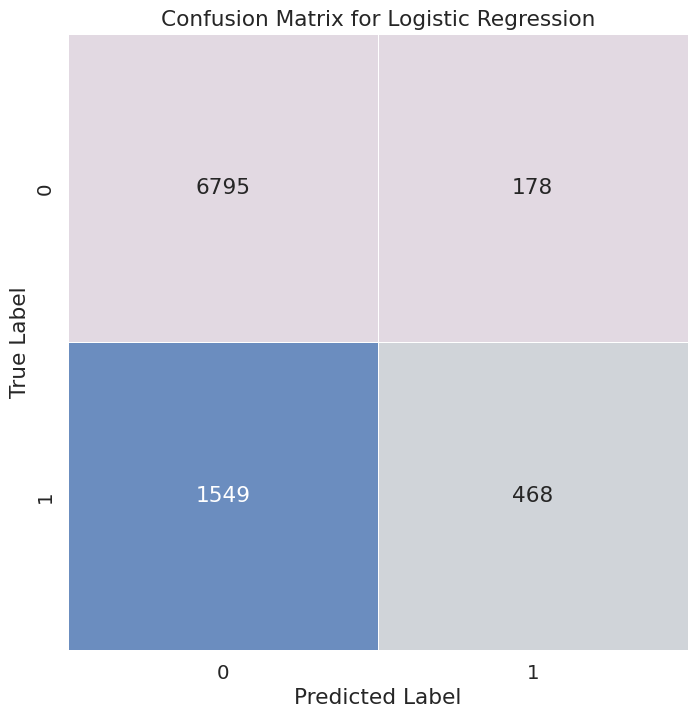

In [ ]:
# Plot confusion matrix for Logistic Regression.
logreg_matrix = confusion_matrix(y_test,log_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(logreg_matrix, annot=True, cbar=False, cmap='twilight',linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for Logistic Regression');

Grid search for logistic regression

In [ ]:
# Hyperparameters to be checked.
parameters = {'C':[0.0001, 0.001, 0.01, 1, 0.1, 10, 100, 1000], 'penalty':['none','l2'] ,
              'solver':['lbfgs','sag','saga','newton-cg']}

# Logistic Regression estimator.
default_logreg=LogisticRegression(multi_class='auto', random_state=25, n_jobs=-1)

# GridSearchCV estimator.
gs_logreg = GridSearchCV(default_logreg, parameters, cv=10, n_jobs=-1, verbose=1)

# Train the GridSearchCV estimator and search for the best parameters.
gs_logreg.fit(X_train,y_train)

Fitting 10 folds for each of 64 candidates, totalling 640 fits


GridSearchCV(cv=10, estimator=LogisticRegression(n_jobs=-1, random_state=25),
             n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 1, 0.1, 10, 100, 1000],
                         'penalty': ['none', 'l2'],
                         'solver': ['lbfgs', 'sag', 'saga', 'newton-cg']},
             verbose=1)

In [ ]:
# Make predictions with the best parameters.
gs_log_pred=gs_logreg.predict(X_test)

Metrics for Grid search logistic regression

In [ ]:
# Best parameters.
print("Best Logistic Regression Parameters: {}".format(gs_logreg.best_params_))

# Cross validation accuracy for the best parameters.
print('Cross-validation accuracy: %0.3f' % gs_logreg.best_score_)

# Accuracy: 1 is perfect prediction.
print('Accuracy: %0.3f' % (gs_logreg.score(X_test,y_test)))

# Precision
print('Precision: %.3f' % precision_score(y_test, gs_log_pred))

# Recall
print('Recall: %.3f' % recall_score(y_test, gs_log_pred))

# f1 score: best value at 1 (perfect precision and recall) and worst at 0.
print('F1 score: %.3f' % f1_score(y_test, gs_log_pred))

Best Logistic Regression Parameters: {'C': 0.0001, 'penalty': 'none', 'solver': 'saga'}
Cross-validation accuracy: 0.811
Accuracy: 0.808
Precision: 0.724
Recall: 0.231
F1 score: 0.350


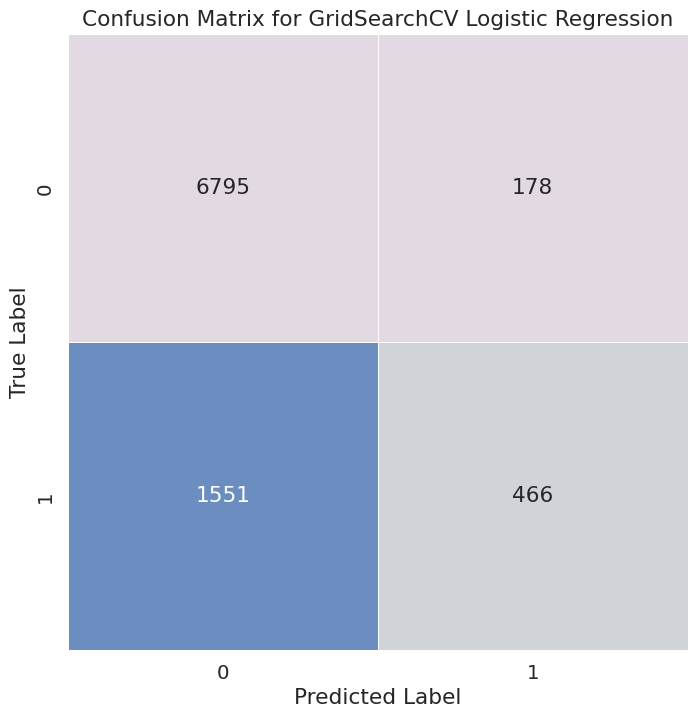

In [ ]:
# Print confusion matrix for Logistic regression.
gs_logreg_matrix = confusion_matrix(y_test,gs_log_pred)
sns.set(font_scale=1.3)
plt.subplots(figsize=(8, 8))
sns.heatmap(gs_logreg_matrix,annot=True, cbar=False, cmap='twilight',linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for GridSearchCV Logistic Regression');

In [ ]:
# Predict probabilities for the test data.
gs_logreg_probs = gs_logreg.predict_proba(X_test)

# Keep Probabilities of the positive class only.
gs_logreg_probs = gs_logreg_probs[:, 1]

# Compute the AUC Score.
gs_logreg_auc = roc_auc_score(y_test, gs_logreg_probs)
print('AUC: %.2f' % gs_logreg_auc)

AUC: 0.73


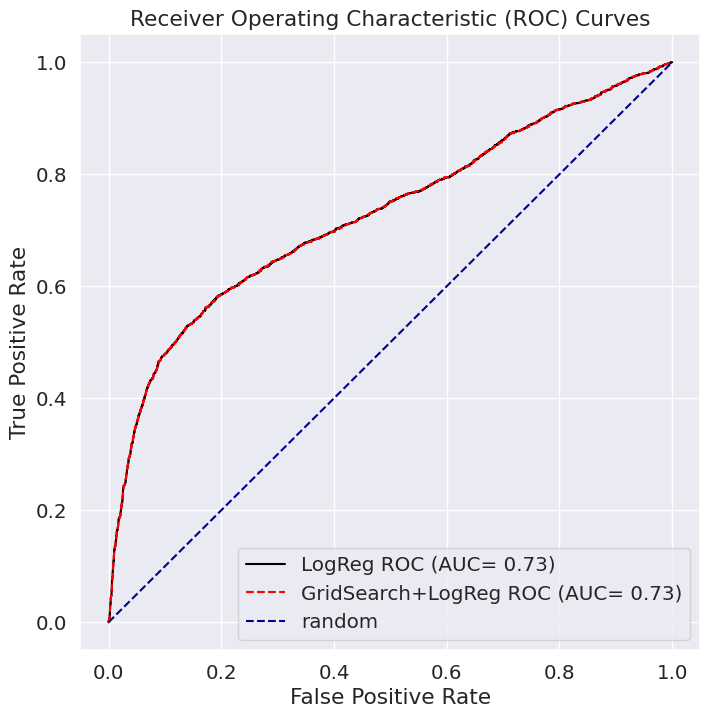

In [ ]:
# Get the ROC curves.
logreg_fpr, logreg_tpr, logreg_thresholds = roc_curve(y_test, logreg_probs)
gs_logreg_fpr, gs_logreg_tpr, gs_logreg_thresholds = roc_curve(y_test, gs_logreg_probs)

# Plot the ROC curves.
plt.figure(figsize=(8,8))
plt.plot(logreg_fpr, logreg_tpr, color='black', label='LogReg ROC (AUC= %0.2f)'% auc_logreg)
plt.plot(gs_logreg_fpr, gs_logreg_tpr, color='red', linestyle='--',label='GridSearch+LogReg ROC (AUC= %0.2f)'% gs_logreg_auc)
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend()
plt.show()

# Visualization

In [ ]:
XX_test = pd.DataFrame(X_test, columns=list(data.columns)[0:23])

In [ ]:
import shap

background_samples = shap.utils.sample(XX_test, 100)  # 100 instances for use as the background distribution

# compute the SHAP values for the linear model
explainer = shap.Explainer(gs_logreg.predict, background_samples)
shap_values = explainer(XX_test)
shap_values

PermutationExplainer explainer: 8991it [06:31, 22.67it/s]                          


.values =
array([[-4.00000000e-03,  1.00000000e-03,  3.50000000e-03, ...,
         0.00000000e+00,  5.00000000e-04,  0.00000000e+00],
       [-2.95000000e-02, -3.50000000e-03,  1.25000000e-02, ...,
         0.00000000e+00,  1.50000000e-03,  3.00000000e-03],
       [-6.50000000e-03,  4.50000000e-03, -3.46944695e-19, ...,
         0.00000000e+00, -5.00000000e-04,  0.00000000e+00],
       ...,
       [-2.50000000e-03, -5.00000000e-04,  2.00000000e-03, ...,
         0.00000000e+00,  0.00000000e+00,  5.00000000e-04],
       [-7.00000000e-03, -1.00000000e-02,  4.95000000e-02, ...,
        -2.00000000e-03, -1.50000000e-03,  5.00000000e-04],
       [-1.00000000e-03,  2.50000000e-03,  2.00000000e-03, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

.base_values =
array([0.03, 0.03, 0.03, ..., 0.03, 0.03, 0.03])

.data =
array([[ 0.40402482, -1.22827978, -1.07483032, ..., -0.30338519,
        -0.31051419, -0.29572913],
       [ 0.79045038,  0.81414676, -1.07483032, ...,  0.0059

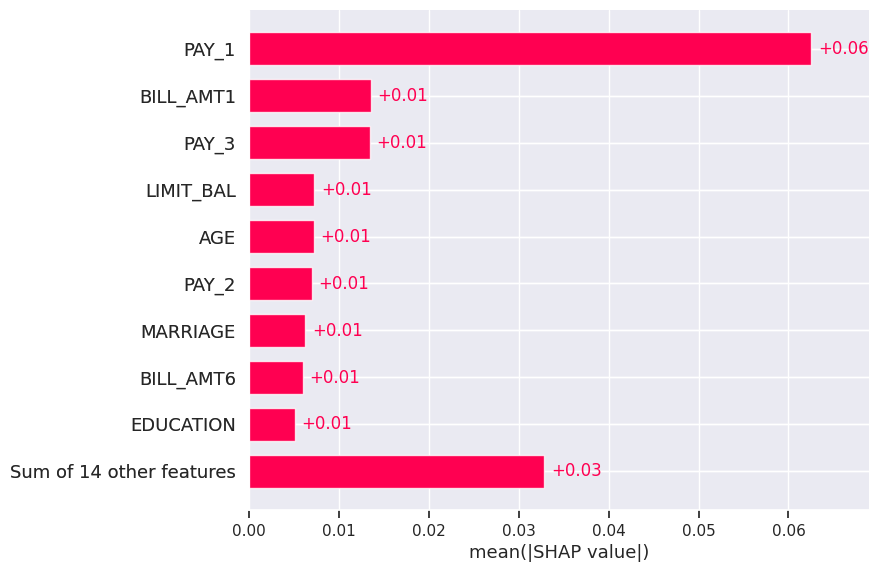

In [ ]:
shap.plots.bar(shap_values)

Pay 1 (the repayment status in September, 2005) seems to be the most important feature in the model. That was expected since it gives information about the latest history in the dataset.

The model might be a bit off in considering Pay 2 (the repayment status in August, 2005) less important than Pay 3 (the repayment status in July, 2005). We don't see any reason to put more weight on older data.

Bill amount variables present a similar phenomenon - Bill Amt 1 (amount of bill statement in September, 2005) is more important than the rest of them since it's the latest one. However, Bill Amt 6 (amount of bill statement in April, 2005) is more imposrtant than Bill Amt 2-5 (amount of bill statement in May 2005 - August, 2005), which doesn't really make sense to us.

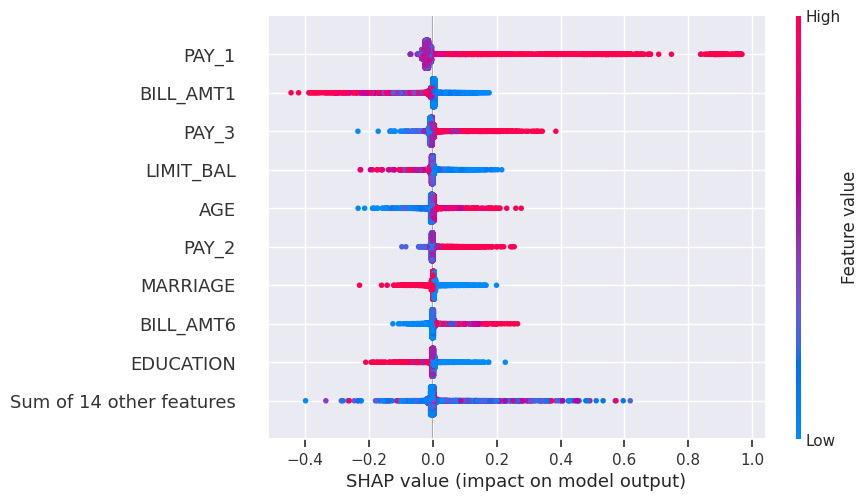

In [ ]:
shap.plots.beeswarm(shap_values)
#shap.plots.violin(shap_values)

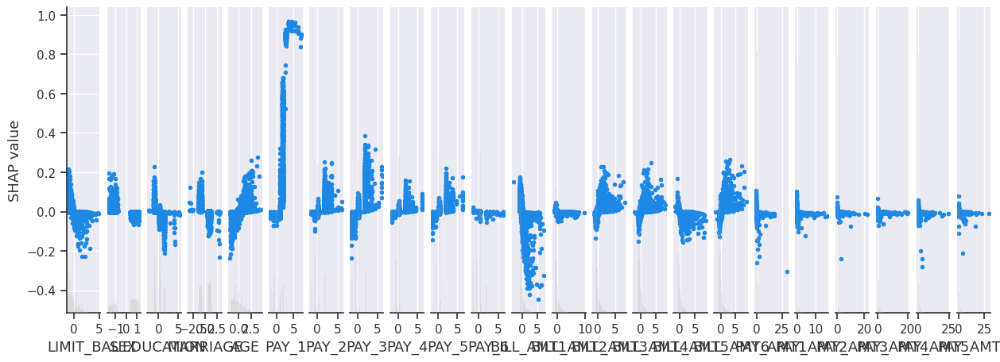

In [ ]:
shap.plots.scatter(shap_values)

In [ ]:
ind = 0
shap.plots.initjs()
shap.plots.force(shap_values)

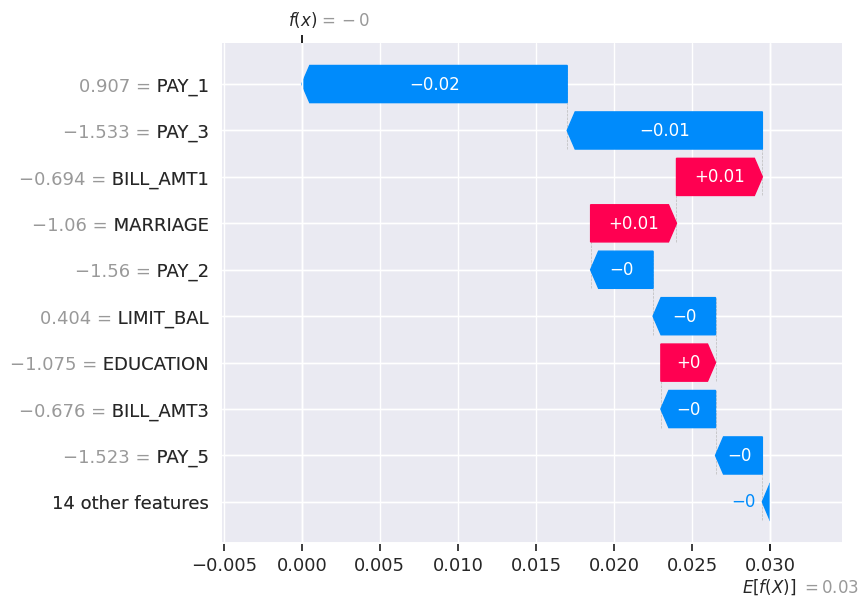

In [ ]:
shap.plots.waterfall(shap_values[ind])

In this example can be seen pretty much the same as in the general "feature importance" plot before. Pay 3 being more important than Pay 1 doesn't make much sense but otherwise the model seems to be deciding based on valid features.

In this case, automatical approach might consist in checking the order of importance of variables Pay 1-6 and Bill Amt 1-6.